<a href="https://colab.research.google.com/github/n9wjntyfw8-max/CAPA-2026-VSNT/blob/main/VSNT_treinamento_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BP Monitor Dataset – Download from Kaggle, Convert XML to JSON, and Visualize Bounding Boxes

This notebook:

1. Downloads the **bp-monitor-reading-medical-device-images** dataset from Kaggle.
2. Converts all Pascal VOC XML annotations to a **COCO-like JSON** file.
3. Uses the JSON to visualize images with bounding boxes for dataset debugging.


In [ ]:
!pip install -q gdown matplotlib pillow

import os, glob, json, shutil
from pathlib import Path


In [ ]:
DATA_DIR = "/content/bp_dataset"
os.makedirs(DATA_DIR, exist_ok=True)

file_id = "1F8_CgijuKkcY_SbhhrdT7Uv-tcvkaTN9"  # seu arquivo no Drive
# file_id = "1QwBpwTBKg67AlhtHvVMId9OOUIqOzK2p"  # seu arquivo no Drive
zip_path = "bp_dataset.zip"

import gdown
gdown.download(id=file_id, output=zip_path, quiet=False)

!unzip -o bp_dataset.zip -d $DATA_DIR

print("Conteúdo relevante:")
for root, dirs, files in os.walk(DATA_DIR):
    xmls = [f for f in files if f.lower().endswith(".xml")]
    imgs = [f for f in files if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    if xmls or imgs:
        print("Pasta:", root)
        print("  XML:", len(xmls), " | Imagens:", len(imgs))

Downloading...
From: https://drive.google.com/uc?id=1F8_CgijuKkcY_SbhhrdT7Uv-tcvkaTN9
To: /content/bp_dataset.zip
100%|██████████| 1.02M/1.02M [00:00<00:00, 51.3MB/s]

Archive:  bp_dataset.zip
 extracting: /content/bp_dataset/test/00013800L_jpg.rf.15220cd21a4e9e44da13789a6d230259.jpg  
 extracting: /content/bp_dataset/test/00013796R_jpg.rf.f1e08e71f39290df61fc869ef51f9509.jpg  
 extracting: /content/bp_dataset/train/00013817L_jpg.rf.bf9c0513581475eb21c36c1735ebc2cd.jpg  
 extracting: /content/bp_dataset/test/00013798R_jpg.rf.8b63b2c70515a7f334779b49a5e8c66a.jpg  
 extracting: /content/bp_dataset/train/00013795L_jpg.rf.f0c7a371e4c97037b0b1e57d17fa5797.jpg  
 extracting: /content/bp_dataset/train/00013815R_jpg.rf.3719bc85d244c1f4d09b0bdc6e9cbffc.jpg  
 extracting: /content/bp_dataset/train/00013799R_jpg.rf.6969217b6c5eef4a8bdbdc6f02aa714e.jpg  
 extracting: /content/bp_dataset/train/00013814L_jpg.rf.ea93f1d61641814c255e92e9ec0bf962.jpg  
 extracting: /content/bp_dataset/train/00013787L_jpg.rf.c1120e5de8257b7e157b0e3f40603233.jpg  
 extracting: /content/bp_dataset/train/00013795R_jpg.rf.58f9bb2019f187fc9c2ad5fc04edb950.jpg  
 extracting: /content/bp_dat

In [ ]:
import xml.etree.ElementTree as ET

XML_ROOT = DATA_DIR
OUTPUT_JSON = os.path.join(DATA_DIR, "bp_monitor_annotations_all.json")

def parse_xml_file(path):
    tree = ET.parse(path)
    root = tree.getroot()

    folder = root.findtext("folder", default="")
    filename = root.findtext("filename", default=os.path.basename(path))

    size_elem = root.find("size")
    width = int(float(size_elem.findtext("width", default="0") or 0))
    height = int(float(size_elem.findtext("height", default="0") or 0))

    objects = []
    for obj in root.findall("object"):
        name = obj.findtext("name", default="")

        bbox = obj.find("bndbox")
        if bbox is None:
            continue

        xmin = float(bbox.findtext("xmin", default="0") or 0)
        ymin = float(bbox.findtext("ymin", default="0") or 0)
        xmax = float(bbox.findtext("xmax", default="0") or 0)
        ymax = float(bbox.findtext("ymax", default="0") or 0)

        attrs_elem = obj.find("attributes")
        attributes = {}
        if attrs_elem is not None:
            for attr in attrs_elem.findall("attribute"):
                aname = attr.findtext("name")
                aval = attr.findtext("value")
                if aname:
                    attributes[aname] = aval

        objects.append(
            {
                "label": name,
                "bbox": {"xmin": xmin, "ymin": ymin, "xmax": xmax, "ymax": ymax},
                "attributes": attributes,
            }
        )

    return {
        "folder": folder,
        "filename": filename,
        "width": width,
        "height": height,
        "objects": objects,
    }

# 1) Encontrar todos os XML
xml_paths = sorted(glob.glob(os.path.join(XML_ROOT, "**", "*.xml"), recursive=True))
print(f"Encontrados {len(xml_paths)} XML.")

if not xml_paths:
    raise RuntimeError("Nenhum XML encontrado. Verifique o DATA_DIR.")

# 2) Parse de todos e coleta de labels
parsed_items = []
label_set = set()

for xp in xml_paths:
    item = parse_xml_file(xp)
    parsed_items.append((xp, item))
    for obj in item["objects"]:
        if obj["label"]:
            label_set.add(obj["label"])

print("Labels encontradas:", label_set)

# 3) Mapear labels para categorias
label_list = sorted(label_set)
categories = [{"id": i+1, "name": name} for i, name in enumerate(label_list)]
label_to_cat_id = {c["name"]: c["id"] for c in categories}

# 4) Montar JSON COCO-like
dataset = {
    "info": {
        "description": "BP monitor dataset (VOC XML -> COCO-like JSON)",
        "version": "1.0",
        "year": 2025,
    },
    "images": [],
    "annotations": [],
    "categories": categories,
}

ann_id = 1
img_id = 1
image_id_to_xml_path = {}

for xp, item in parsed_items:
    dataset["images"].append({
        "id": img_id,
        "file_name": item["filename"],
        "width": item["width"],
        "height": item["height"],
    })
    image_id_to_xml_path[img_id] = xp

    for obj in item["objects"]:
        label = obj["label"]
        if label not in label_to_cat_id:
            continue
        cat_id = label_to_cat_id[label]
        x_min = obj["bbox"]["xmin"]
        y_min = obj["bbox"]["ymin"]
        x_max = obj["bbox"]["xmax"]
        y_max = obj["bbox"]["ymax"]
        w = x_max - x_min
        h = y_max - y_min

        dataset["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": cat_id,
            "bbox": [x_min, y_min, w, h],
            "area": w * h,
            "iscrowd": 0,
            "attributes": obj["attributes"],
        })
        ann_id += 1

    img_id += 1

with open(OUTPUT_JSON, "w", encoding="utf-8") as f:
    json.dump(dataset, f, ensure_ascii=False, indent=2)

print("JSON salvo em:", OUTPUT_JSON)
print("Categorias:", categories)

Encontrados 37 XML.
Labels encontradas: {'alvo'}
JSON salvo em: /content/bp_dataset/bp_monitor_annotations_all.json
Categorias: [{'id': 1, 'name': 'alvo'}]


#Etapa 4

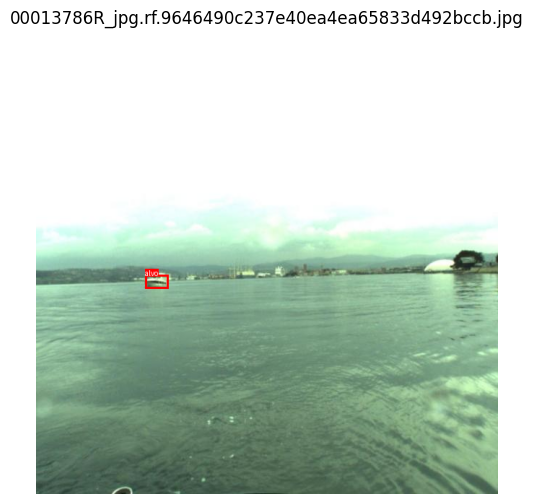

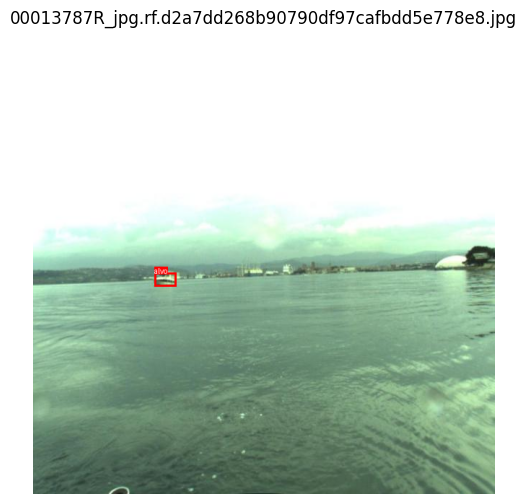

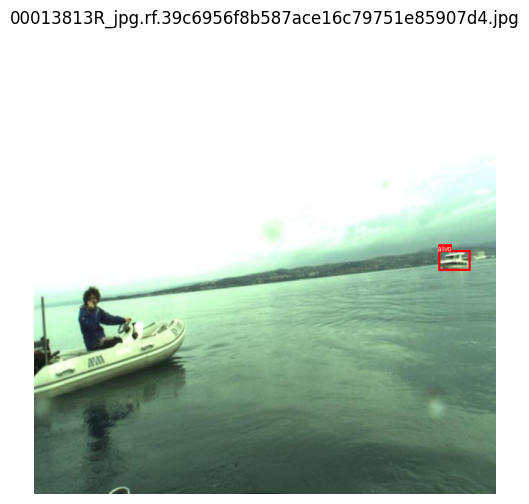

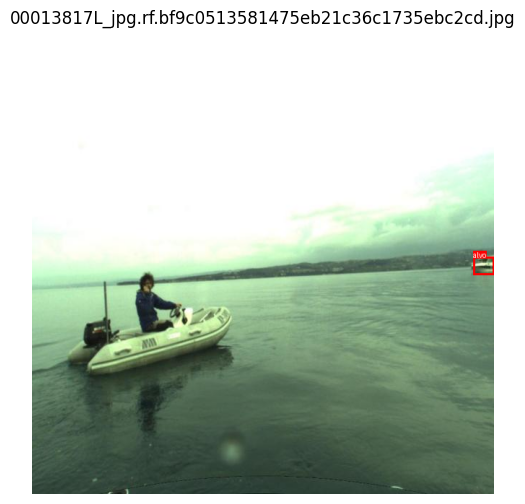

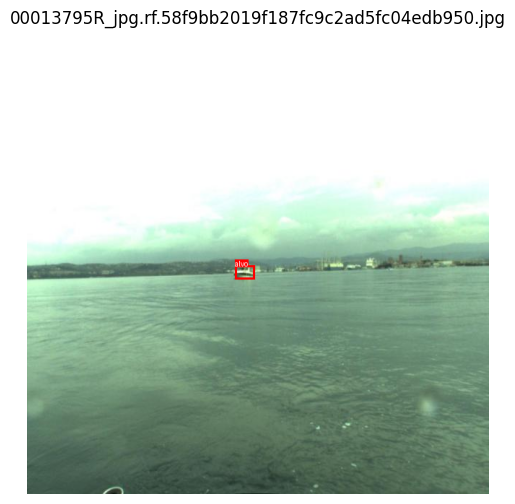

In [ ]:
from collections import defaultdict
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

with open(OUTPUT_JSON, "r", encoding="utf-8") as f:
    data = json.load(f)

images = data["images"]
annotations = data["annotations"]
categories = data["categories"]

cat_id_to_name = {c["id"]: c["name"] for c in categories}
img_id_to_info = {img["id"]: img for img in images}
img_id_to_anns = defaultdict(list)
for ann in annotations:
    img_id_to_anns[ann["image_id"]].append(ann)

def find_image_path(image_id, base_dir=DATA_DIR):
    info = img_id_to_info[image_id]
    fname = info["file_name"]

    # tenta mesma pasta do XML
    xp = image_id_to_xml_path.get(image_id)
    if xp is not None:
        xml_dir = os.path.dirname(xp)
        cand = os.path.join(xml_dir, fname)
        if os.path.exists(cand):
            return cand

    # senão, busca global
    matches = glob.glob(os.path.join(base_dir, "**", fname), recursive=True)
    if matches:
        return matches[0]
    return None

def show_image_with_bboxes(image_id):
    info = img_id_to_info[image_id]
    fname = info["file_name"]
    path = find_image_path(image_id)
    if path is None:
        print("Imagem não encontrada:", fname)
        return

    image = Image.open(path).convert("RGB")
    draw = ImageDraw.Draw(image)
    try:
        font = ImageFont.truetype("arial.ttf", 18)
    except:
        font = ImageFont.load_default()

    anns = img_id_to_anns.get(image_id, [])
    for ann in anns:
        x_min, y_min, w, h = ann["bbox"]
        x_max = x_min + w
        y_max = y_min + h
        draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)
        cname = cat_id_to_name.get(ann["category_id"], "obj")
        tb = draw.textbbox((0, 0), cname, font=font)
        tw, th = tb[2]-tb[0], tb[3]-tb[1]
        tx, ty = x_min, max(0, y_min - th)
        draw.rectangle([tx, ty, tx+tw, ty+th], fill="red")
        draw.text((tx, ty), cname, fill="white", font=font)

    plt.figure(figsize=(6,6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(fname)
    plt.show()

import random
sample_ids = random.sample([img["id"] for img in images], min(5, len(images)))
for iid in sample_ids:
    show_image_with_bboxes(iid)

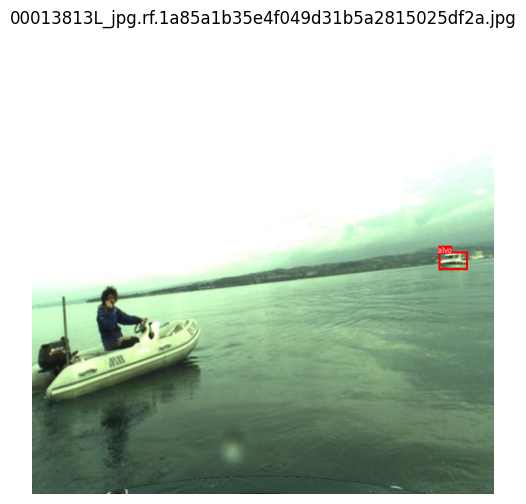

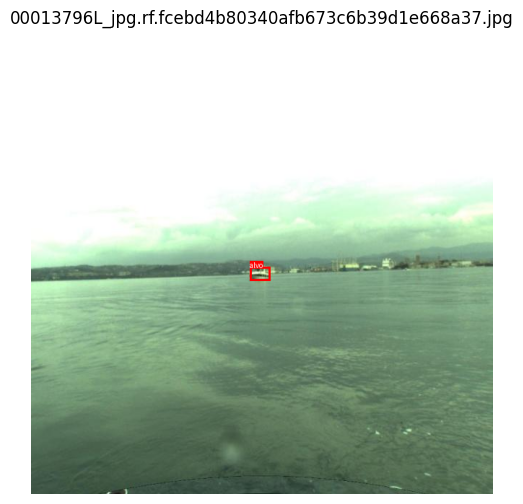

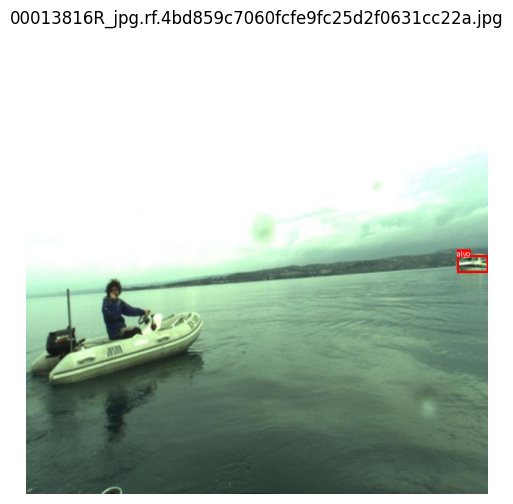

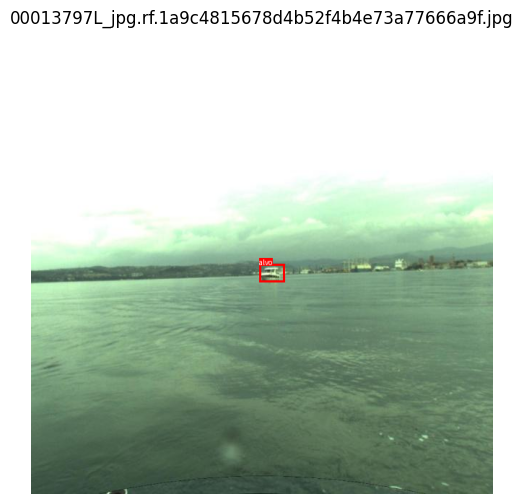

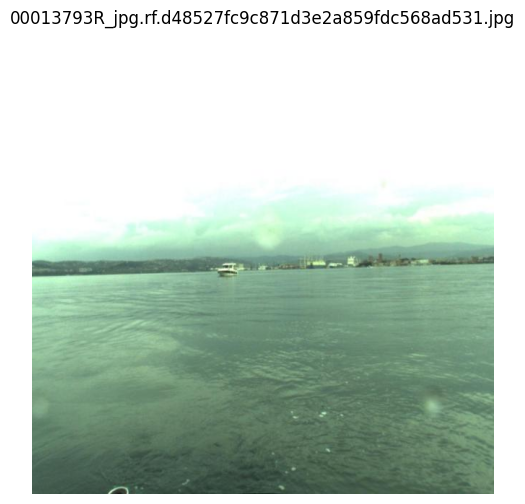

...

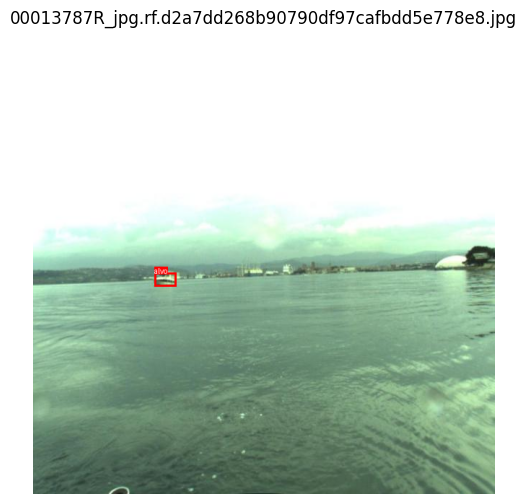

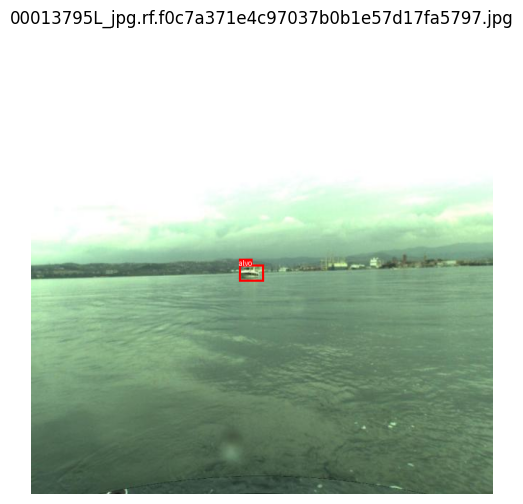

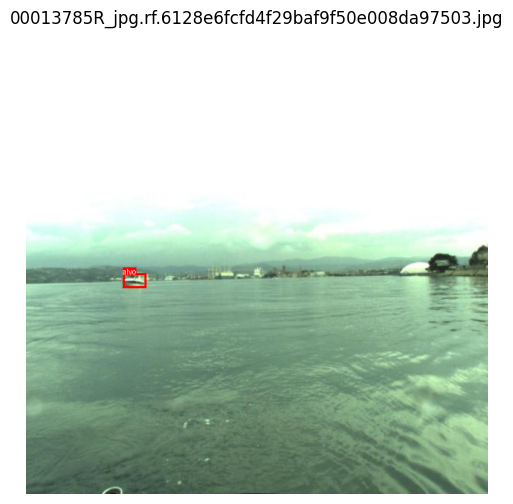

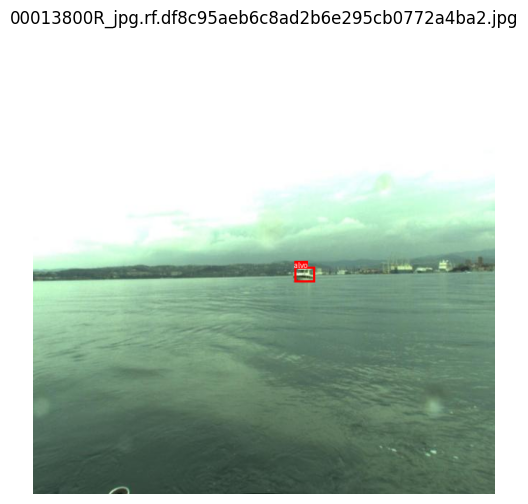

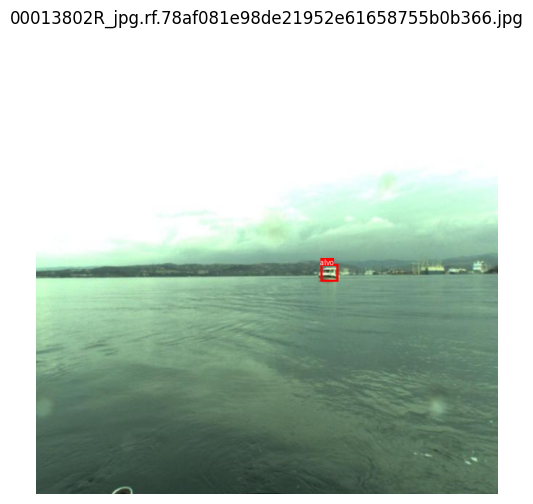

In [ ]:
sample_ids = random.sample([img["id"] for img in images], min(176, len(images)))
for iid in sample_ids:
    show_image_with_bboxes(iid)


#Etapa 5

In [ ]:
import tensorflow as tf

IMG_SIZE = 320
BATCH_SIZE = 8

records = []
for img in images:
    iid = img["id"]
    anns = img_id_to_anns.get(iid, [])
    if not anns:
        continue
    ann = anns[0]  # pega primeira bbox
    bbox = ann["bbox"]
    path = find_image_path(iid)
    if path is None:
        continue
    records.append({
        "image_path": path,
        "bbox": bbox,
        "width": img["width"],
        "height": img["height"],
        "label_id": ann["category_id"],
    })

print("Registros utilizáveis:", len(records))
if not records:
    raise RuntimeError("Nenhum registro válido encontrado.")

Registros utilizáveis: 36


#Etapa 6

In [ ]:
import tensorflow as tf

# Cria listas separadas a partir de 'records'
paths   = [r["image_path"] for r in records]
bboxes  = [r["bbox"]       for r in records]  # cada um é [x_min, y_min, w, h]
widths  = [r["width"]      for r in records]
heights = [r["height"]     for r in records]
labels  = [r["label_id"]   for r in records]  # aqui é sempre 1, mas deixei genérico

print("Exemplo de path:", paths[0])
print("Exemplo de bbox:", bboxes[0], "w,h:", widths[0], heights[0])

def preprocess_example(path, bbox, width, height, label_id):
    # carregar imagem
    img_bytes = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img_bytes, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)  # [0,1]
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))

    # bbox absoluta: [x_min, y_min, w, h]
    bbox = tf.cast(bbox, tf.float32)
    x_min, y_min, w, h = tf.unstack(bbox)

    x_center = x_min + w / 2.0
    y_center = y_min + h / 2.0

    img_w = tf.cast(width, tf.float32)
    img_h = tf.cast(height, tf.float32)

    cx = x_center / img_w
    cy = y_center / img_h
    nw = w / img_w
    nh = h / img_h

    bbox_norm = tf.stack([cx, cy, nw, nh])
    # uma classe única -> 1.0
    class_label = tf.cast(1.0, tf.float32)

    return img, {"bbox": bbox_norm, "class": class_label}

# Cria o dataset a partir das listas
ds = tf.data.Dataset.from_tensor_slices((paths, bboxes, widths, heights, labels))
ds = ds.shuffle(len(records)).map(preprocess_example, num_parallel_calls=tf.data.AUTOTUNE)

# separa em treino/val antes de batch
train_size = int(0.8 * len(records))
train_ds = ds.take(train_size)
val_ds   = ds.skip(train_size)

# agora aplica batch e prefetch
train_ds = train_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds   = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

train_ds, val_ds

Exemplo de path: /content/bp_dataset/test/00013796R_jpg.rf.f1e08e71f39290df61fc869ef51f9509.jpg
Exemplo de bbox: [301.0, 326.0, 28.0, 19.0] w,h: 640 640


(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 320, 320, 3), dtype=tf.float32, name=None), {'bbox': TensorSpec(shape=(None, 4), dtype=tf.float32, name=None), 'class': TensorSpec(shape=(None,), dtype=tf.float32, name=None)})>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 320, 320, 3), dtype=tf.float32, name=None), {'bbox': TensorSpec(shape=(None, 4), dtype=tf.float32, name=None), 'class': TensorSpec(shape=(None,), dtype=tf.float32, name=None)})>)

#Etapa 7

In [ ]:
from tensorflow.keras import layers, models

def build_detector(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    base = tf.keras.applications.EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_shape=input_shape,
        pooling="avg",
    )
    inputs = tf.keras.Input(shape=input_shape)
    x = base(inputs, training=False)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.2)(x)

    # saída bbox: 4 valores normalizados [0,1]
    bbox_out = layers.Dense(4, activation="sigmoid", name="bbox")(x)
    # saída classe: presença do objeto
    class_out = layers.Dense(1, activation="sigmoid", name="class")(x)

    model = tf.keras.Model(inputs=inputs, outputs={"bbox": bbox_out, "class": class_out})
    return model

model = build_detector()
model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 320, 320,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetb0      │ (None, 1280)      │  4,049,571 │ input_layer_1[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │    163,968 │ efficientnetb0[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bbox (Dense)        │ (None, 4)         │        516 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class (Dense)       │ (None, 1)         │        129 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 4,172,161 (15.92 MB)

 Non-trainable params: 42,023 (164.16 KB)

#Etapa 8

In [ ]:
bbox_loss = tf.keras.losses.MeanSquaredError()
class_loss = tf.keras.losses.BinaryCrossentropy()

losses = {
    "bbox": bbox_loss,
    "class": class_loss,
}
loss_weights = {"bbox": 1.0, "class": 1.0}

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=losses,
    loss_weights=loss_weights,
    metrics={"class": "accuracy"},
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,   # você pode ajustar
)

Epoch 1/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 49s 3s/step - bbox_loss: 0.1576 - class_accuracy: 0.5714 - class_loss: 0.6544 - loss: 0.8226 - val_bbox_loss: 0.1150 - val_class_accuracy: 0.0000e+00 - val_class_loss: 0.7903 - val_loss: 0.9053
Epoch 2/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 0.1461 - class_accuracy: 1.0000 - class_loss: 0.4223 - loss: 0.5800 - val_bbox_loss: 0.1094 - val_class_accuracy: 0.0000e+00 - val_class_loss: 0.9385 - val_loss: 1.0479
Epoch 3/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 0.1478 - class_accuracy: 1.0000 - class_loss: 0.2921 - loss: 0.4413 - val_bbox_loss: 0.1176 - val_class_accuracy: 0.0000e+00 - val_class_loss: 1.1804 - val_loss: 1.2980
Epoch 4/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 0.1340 - class_accuracy: 1.0000 - class_loss: 0.1749 - loss: 0.3122 - val_bbox_loss: 0.1061 - val_class_accuracy: 0.0000e+00 - val_class_loss: 1.3614 - val_loss: 1.4674
Epoch 5/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 0.1179 - class_accuracy

#Etapa 9 - salvar o modelo

In [ ]:
# export_dir = "/content/bp_detector_model"
# model.save(export_dir)
# print("Modelo salvo em:", export_dir)

export_dir = "/content/bp_detector_model"

# Em Keras 3, para exportar SavedModel:
model.export(export_dir)

print("SavedModel exportado em:", export_dir)


Saved artifact at '/content/bp_detector_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 320, 320, 3), dtype=tf.float32, name='keras_tensor_239')
Output Type:
  Dict[['bbox', TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)], ['class', TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)]]
Captures:
  134721713625552: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  134721713621712: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  134722097011920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097014224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097013840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097014992: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097011344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097014800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134722097016912: TensorSpec(shape=(),

## Etapa 10 - Usar o modelo salvo para inferência

In [ ]:
import tensorflow as tf
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import random
import glob
import os

# Ensure IMG_SIZE is defined as it was during training
# If it's not available in kernel state, you might need to redefine it.
# Assuming IMG_SIZE and DATA_DIR are still in the kernel state.

# Load the SavedModel
# The 'export_dir' variable should be available from previous cells
# export_dir = "/content/bp_detector_model"

loaded_model = tf.saved_model.load(export_dir)
print(f"Modelo carregado de: {export_dir}")

Modelo carregado de: /content/bp_detector_model


In [ ]:
def predict_and_draw_bboxes(image_path, model, img_size=IMG_SIZE, score_threshold=0.5, class_name="alvo"):
    # Load image
    original_image = Image.open(image_path).convert("RGB")
    original_width, original_height = original_image.size

    # Preprocess image for the model
    img_tensor = tf.io.read_file(image_path)
    img_tensor = tf.io.decode_jpeg(img_tensor, channels=3)
    img_tensor = tf.image.convert_image_dtype(img_tensor, tf.float32)  # [0,1]
    img_tensor = tf.image.resize(img_tensor, (img_size, img_size))
    img_tensor = tf.expand_dims(img_tensor, axis=0) # Add batch dimension

    # Perform inference
    predictions = model.signatures["serving_default"](img_tensor)
    pred_bbox = predictions['bbox'].numpy()[0] # Remove batch dim
    pred_class_score = predictions['class'].numpy()[0][0] # Remove batch dim

    # Draw on image if score is above threshold
    draw = ImageDraw.Draw(original_image)
    try:
        font = ImageFont.truetype("arial.ttf", 18)
    except:
        font = ImageFont.load_default()

    if pred_class_score >= score_threshold:
        # Convert normalized [cx, cy, w, h] to absolute [x_min, y_min, w, h]
        cx, cy, nw, nh = pred_bbox

        # Denormalize to original image coordinates
        abs_cx = cx * original_width
        abs_cy = cy * original_height
        abs_w = nw * original_width
        abs_h = nh * original_height

        x_min = abs_cx - (abs_w / 2)
        y_min = abs_cy - (abs_h / 2)
        x_max = x_min + abs_w
        y_max = y_min + abs_h

        # Ensure coordinates are within image bounds
        x_min, y_min, x_max, y_max = max(0, x_min), max(0, y_min), min(original_width, x_max), min(original_height, y_max)

        draw.rectangle([x_min, y_min, x_max, y_max], outline="blue", width=3)

        display_text = f"{class_name}: {pred_class_score:.2f}"
        tb = draw.textbbox((0, 0), display_text, font=font)
        tw, th = tb[2]-tb[0], tb[3]-tb[1]
        tx, ty = x_min, max(0, y_min - th) # Position text above bbox, adjust if needed
        draw.rectangle([tx, ty, tx+tw, ty+th], fill="blue")
        draw.text((tx, ty), display_text, fill="white", font=font)

    plt.figure(figsize=(8,8))
    plt.imshow(original_image)
    plt.axis("off")
    plt.title(f"Prediction for {os.path.basename(image_path)}")
    plt.show()


### Testando o modelo em algumas imagens

Performing inference on 5 sample images...


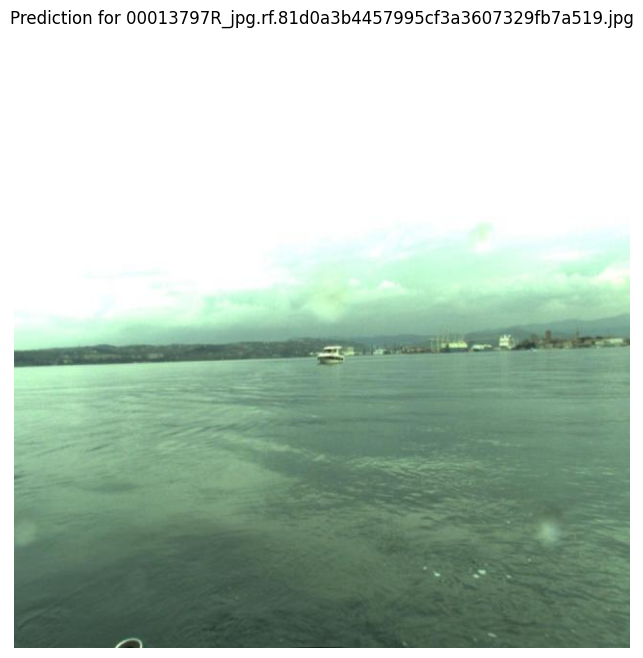

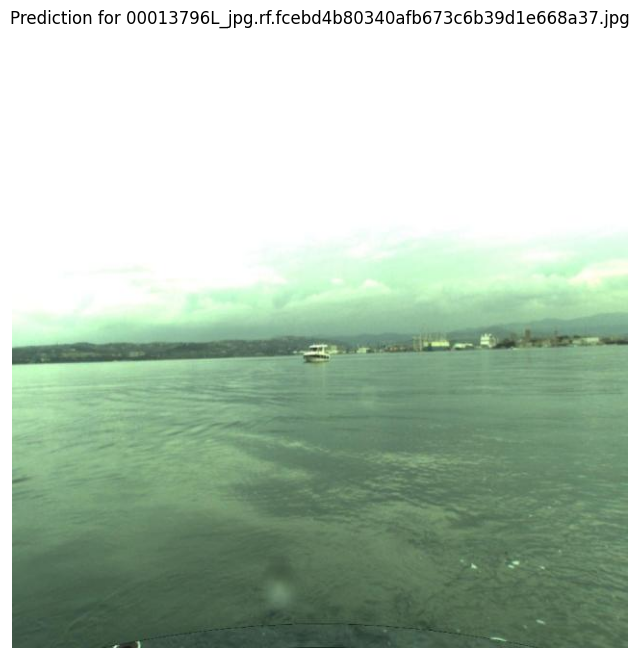

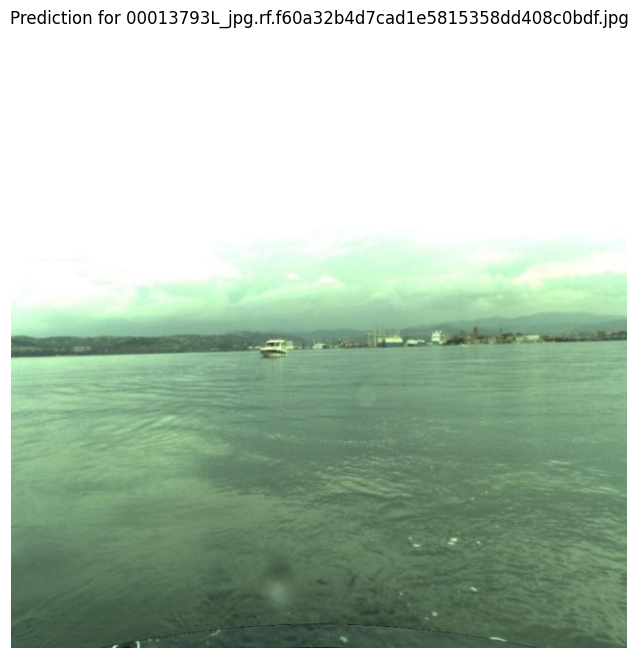

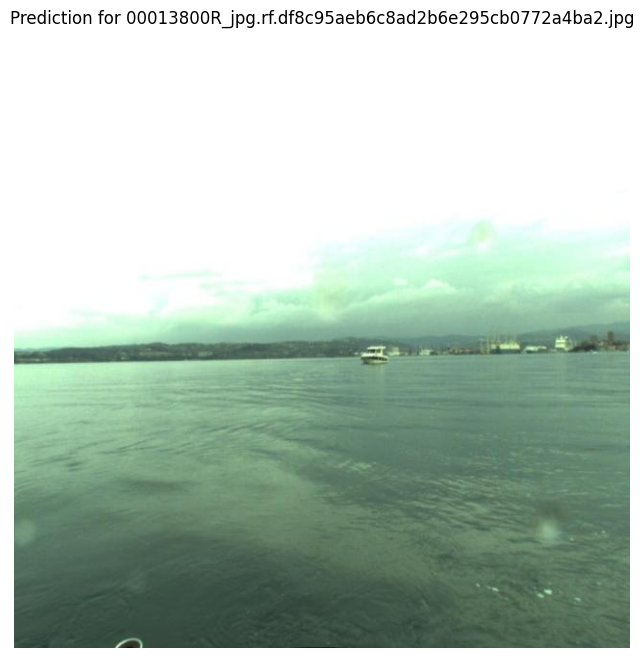

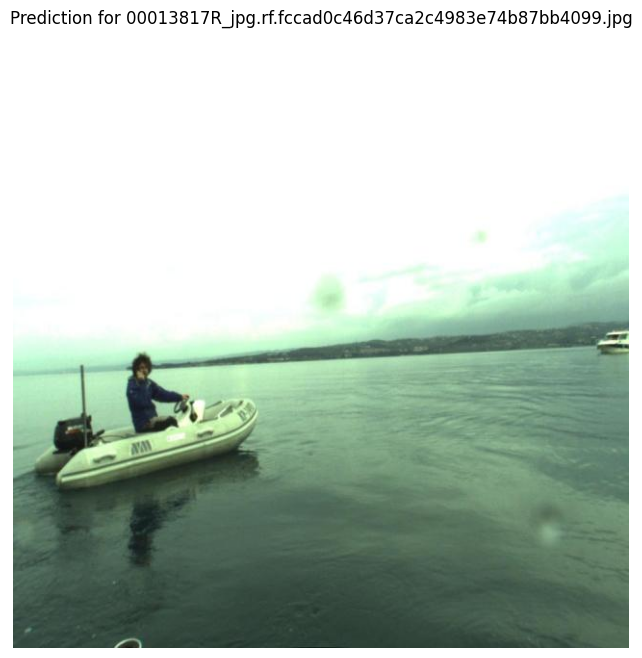

In [ ]:
# Get all image paths in the DATA_DIR recursively
all_image_paths = glob.glob(os.path.join(DATA_DIR, '**', '*.jpg'), recursive=True) + \
                  glob.glob(os.path.join(DATA_DIR, '**', '*.jpeg'), recursive=True) + \
                  glob.glob(os.path.join(DATA_DIR, '**', '*.png'), recursive=True)

# Select a few random images to test
num_test_images = 5
sample_image_paths = random.sample(all_image_paths, min(num_test_images, len(all_image_paths)))

print(f"Performing inference on {len(sample_image_paths)} sample images...")

for img_path in sample_image_paths:
    predict_and_draw_bboxes(img_path, loaded_model, img_size=IMG_SIZE)


#Etapa 10 - converter para TFLite

In [ ]:
def representative_data_gen():
    for imgs, targets in ds.take(50):
        yield [imgs]

converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8

tflite_model = converter.convert()

tflite_path = "/content/bp_detector_int8.tflite"
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

print("Modelo TFLite int8 salvo em:", tflite_path)


Modelo TFLite int8 salvo em: /content/bp_detector_int8.tflite


#Etapa 11 - baixar o modelo

In [ ]:
from google.colab import files
files.download(tflite_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>